### CA1 – Statistical Techniques HDip
#### Author: Cristhian Macedo - 2024104
[GitHub Repository](https://github.com/CristhianMacedo2024104/Statistical-Techniques)

### 1.1 Importing libraries

Importing the required libraries "`pandas`" to start the project.

Also importing "`numpy`", "`seaborn`", "`matplotlib.pyplot`" and "`sklearn.decomposition`", in case it needs other libraries it will be imported when necessary it comes.

In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline
sns.set()

import warnings
warnings.filterwarnings("ignore")

### 1.2	Loading Data from a .data file

Loading the dataset using the function “`.read_csv`” to import the required data existing in the Comma-separated values "`.csv`" file in the `df` variable.

In [2]:
df = pd.read_csv("Spotify_Youtube.csv")

### 1.3	Inspecting the Data Set

The first command useful to start understanding the data is “`.head()`” to check the first 5 observations as default and features contained in the data frame after loaded. 

This command was important and necessary to get the first impression of it, returning that this dataset has **n** rows (observations) and **28** columns (features).

In [3]:
df.head(2)

,Unnamed: 0,Artist,Url_spotify,Track,Album,Album_type,Uri,Danceability,Energy,Key,...,Url_youtube,Title,Channel,Views,Likes,Comments,Description,Licensed,official_video,Stream
0,0,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,Feel Good Inc.,Demon Days,album,spotify:track:0d28khcov6AiegSCpG5TuT,0.818,0.705,6.0,...,https://www.youtube.com/watch?v=HyHNuVaZJ-k,Gorillaz - Feel Good Inc. (Official Video),Gorillaz,693555221.0,6220896.0,169907.0,Official HD Video for Gorillaz' fantastic trac...,True,True,1.040235e+09
1,1,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,Rhinestone Eyes,Plastic Beach,album,spotify:track:1foMv2HQwfQ2vntFf9HFeG,0.676,0.703,8.0,...,https://www.youtube.com/watch?v=yYDmaexVHic,Gorillaz - Rhinestone Eyes [Storyboard Film] (...,Gorillaz,72011645.0,1079128.0,31003.0,The official video for Gorillaz - Rhinestone E...,True,True,3.100837e+08


Thereafter using the command “`shape`” shows us the complete body of the data, in this case **20718** observations and **28** features to be analysed.

In [4]:
df.shape

(20718, 28)

Used “```.info()```” next to Print a concise summary of a DataFrame. Getting this information it was necessary to learn the names of features existing and the difference between the total of observations shown before in the “`shape`” command and their respective data types.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20718 entries, 0 to 20717
Data columns (total 28 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        20718 non-null  int64  
 1   Artist            20718 non-null  object 
 2   Url_spotify       20718 non-null  object 
 3   Track             20718 non-null  object 
 4   Album             20718 non-null  object 
 5   Album_type        20718 non-null  object 
 6   Uri               20718 non-null  object 
 7   Danceability      20716 non-null  float64
 8   Energy            20716 non-null  float64
 9   Key               20716 non-null  float64
 10  Loudness          20716 non-null  float64
 11  Speechiness       20716 non-null  float64
 12  Acousticness      20716 non-null  float64
 13  Instrumentalness  20716 non-null  float64
 14  Liveness          20716 non-null  float64
 15  Valence           20716 non-null  float64
 16  Tempo             20716 non-null  float6

The "`.describe()`" function shows us a little more about each feature, we can see statistics information about: count, mean, standard deviation, min, Q1 25%, Q2 50%, Q3 75% and max

In [6]:
df.describe()

,Unnamed: 0,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Views,Likes,Comments,Stream
count,20718.000000,20716.000000,20716.000000,20716.000000,20716.000000,20716.000000,20716.000000,20716.000000,20716.000000,20716.000000,20716.000000,2.071600e+04,2.024800e+04,2.017700e+04,2.014900e+04,2.014200e+04
mean,10358.500000,0.619777,0.635250,5.300348,-7.671680,0.096456,0.291535,0.055962,0.193521,0.529853,120.638340,2.247176e+05,9.393782e+07,6.633411e+05,2.751899e+04,1.359422e+08
std,5980.915774,0.165272,0.214147,3.576449,4.632749,0.111960,0.286299,0.193262,0.168531,0.245441,29.579018,1.247905e+05,2.746443e+08,1.789324e+06,1.932347e+05,2.441321e+08
min,0.000000,0.000000,0.000020,0.000000,-46.251000,0.000000,0.000001,0.000000,0.014500,0.000000,0.000000,3.098500e+04,0.000000e+00,0.000000e+00,0.000000e+00,6.574000e+03
25%,5179.250000,0.518000,0.507000,2.000000,-8.858000,0.035700,0.045200,0.000000,0.094100,0.339000,97.002000,1.800095e+05,1.826002e+06,2.158100e+04,5.090000e+02,1.767486e+07
50%,10358.500000,0.637000,0.666000,5.000000,-6.536000,0.050500,0.193000,0.000002,0.125000,0.537000,119.965000,2.132845e+05,1.450110e+07,1.244810e+05,3.277000e+03,4.968298e+07
75%,15537.750000,0.740250,0.798000,8.000000,-4.931000,0.103000,0.477250,0.000463,0.237000,0.726250,139.935000,2.524430e+05,7.039975e+07,5.221480e+05,1.436000e+04,1.383581e+08
max,20717.000000,0.975000,1.000000,11.000000,0.920000,0.964000,0.996000,1.000000,1.000000,0.993000,243.372000,4.676058e+06,8.079649e+09,5.078865e+07,1.608314e+07,3.386520e+09


In [7]:
# pip install ydata-profiling

In [8]:
# from ydata_profiling import ProfileReport
# ProfileReport(df)

### 1.4 Checking the types of data

Using "`df.dtypes`" it is possible to get information on each feature and check their respective data types if are correct, make sense or not, comparing with the "`.head()`" command and the dictionary of the data.

In [9]:
df.dtypes

Unnamed: 0            int64
Artist               object
Url_spotify          object
Track                object
Album                object
Album_type           object
Uri                  object
Danceability        float64
Energy              float64
Key                 float64
Loudness            float64
Speechiness         float64
Acousticness        float64
Instrumentalness    float64
Liveness            float64
Valence             float64
Tempo               float64
Duration_ms         float64
Url_youtube          object
Title                object
Channel              object
Views               float64
Likes               float64
Comments            float64
Description          object
Licensed             object
official_video       object
Stream              float64
dtype: object

Another command useful here at this moment is "`.unique()`" which shows the unique content in the specific feature, and allow us to check if there are any divergence of the values.

In [10]:
df['Album_type'].unique()

array(['album', 'single', 'compilation'], dtype=object)

Until here these commands were essential to understand the data set and get more into, this data frame has **20718** observations and **28** features to be analysed, looks like that there are no different data types as described in the data dictionary in the end of this document.

## 2. Data Preparation

### 2.1 Finding Unique Values

Checking the name of the features using the command "`.columns`"

In [11]:
df.columns

Index(['Unnamed: 0', 'Artist', 'Url_spotify', 'Track', 'Album', 'Album_type',
       'Uri', 'Danceability', 'Energy', 'Key', 'Loudness', 'Speechiness',
       'Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo',
       'Duration_ms', 'Url_youtube', 'Title', 'Channel', 'Views', 'Likes',
       'Comments', 'Description', 'Licensed', 'official_video', 'Stream'],
      dtype='object')

Used the method "`.value_counts()`" to "Return a Series containing the frequency of each distinct row in the Dataframe." (The Pandas Development Team , 2024), it was helpful to use in classification features to understand better what it was going on.

In [12]:
df["Album_type"].value_counts()

Album_type
album          14926
single          5004
compilation      788
Name: count, dtype: int64

Using the method "`.unique()`" to check the values togheter with the command "`.value_counts()`"

In [13]:
df['Album_type'].unique()

array(['album', 'single', 'compilation'], dtype=object)

It uses the command “`.isnull().sum()`” to get the amount of any missing values existent. In this case the features: (Danceability, Energy, Key, Loudness, Speechiness, Acousticness, Instrumentalness, Liveness, Valence, Tempo, Duration_ms, Url_youtube, Title, Channel, Views, Likes, Comments, Description, Licensed, official_video, Stream) all of them there are some missing values.

In [14]:
df.isnull().sum()

Unnamed: 0            0
Artist                0
Url_spotify           0
Track                 0
Album                 0
Album_type            0
Uri                   0
Danceability          2
Energy                2
Key                   2
Loudness              2
Speechiness           2
Acousticness          2
Instrumentalness      2
Liveness              2
Valence               2
Tempo                 2
Duration_ms           2
Url_youtube         470
Title               470
Channel             470
Views               470
Likes               541
Comments            569
Description         876
Licensed            470
official_video      470
Stream              576
dtype: int64

The command “`.isnull().mean() * 100`” is essential to understand and get the percentage of missing values existing using the method mean. In this case, it was noticed that considering 100% of the total values there are not as many feature missing values, the most feature missing value is `Description` with 4.22% followed by `Stream`, `Comments` with 2.7% and so on.

In [15]:
df.isnull().mean() * 100

Unnamed: 0          0.000000
Artist              0.000000
Url_spotify         0.000000
Track               0.000000
Album               0.000000
Album_type          0.000000
Uri                 0.000000
Danceability        0.009653
Energy              0.009653
Key                 0.009653
Loudness            0.009653
Speechiness         0.009653
Acousticness        0.009653
Instrumentalness    0.009653
Liveness            0.009653
Valence             0.009653
Tempo               0.009653
Duration_ms         0.009653
Url_youtube         2.268559
Title               2.268559
Channel             2.268559
Views               2.268559
Likes               2.611256
Comments            2.746404
Description         4.228207
Licensed            2.268559
official_video      2.268559
Stream              2.780191
dtype: float64

Below it was used in a matrix graphic imported from missingno library that shows us the features missing values 

In [16]:
# pip install missingno

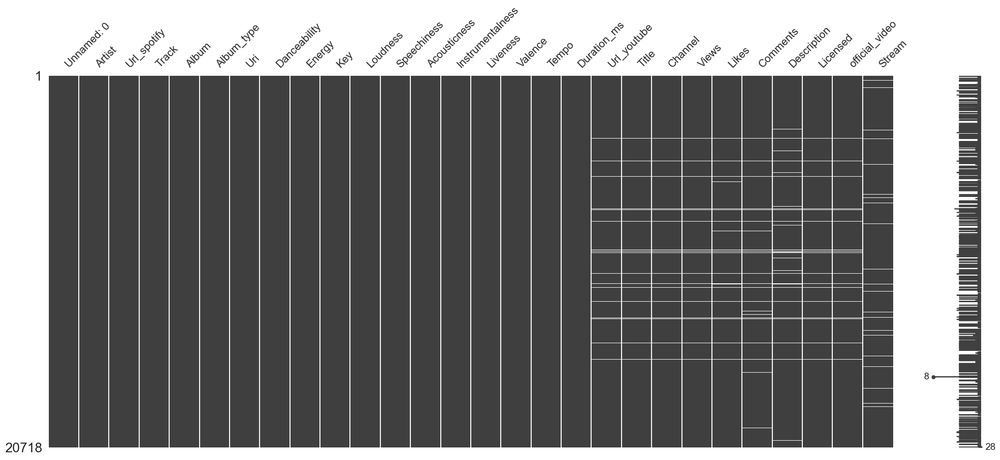

In [17]:
import missingno as msno
ax = msno.matrix(df.sample(20718))

### 2.2 Replacing Values (Syntax errors)

At the moment, a feature with syntax errors has not been found, which will impact the development of this project. If something is found, it will be dealt with.

### 2.3 Dropping Irrelevant Columns

In [18]:
df.columns

Index(['Unnamed: 0', 'Artist', 'Url_spotify', 'Track', 'Album', 'Album_type',
       'Uri', 'Danceability', 'Energy', 'Key', 'Loudness', 'Speechiness',
       'Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo',
       'Duration_ms', 'Url_youtube', 'Title', 'Channel', 'Views', 'Likes',
       'Comments', 'Description', 'Licensed', 'official_video', 'Stream'],
      dtype='object')

Dropped the irrelevant columns: Unnamed: 0, Url_spotify, Uri, Key, Url_youtube, Title, Description

In [19]:
df = df.drop(columns = ['Unnamed: 0', 'Url_spotify', 'Uri', 'Key', 'Url_youtube', 'Title', 'Description'])

In [20]:
df.head(2)

,Artist,Track,Album,Album_type,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,...,Valence,Tempo,Duration_ms,Channel,Views,Likes,Comments,Licensed,official_video,Stream
0,Gorillaz,Feel Good Inc.,Demon Days,album,0.818,0.705,-6.679,0.1770,0.00836,0.002330,...,0.772,138.559,222640.0,Gorillaz,693555221.0,6220896.0,169907.0,True,True,1.040235e+09
1,Gorillaz,Rhinestone Eyes,Plastic Beach,album,0.676,0.703,-5.815,0.0302,0.08690,0.000687,...,0.852,92.761,200173.0,Gorillaz,72011645.0,1079128.0,31003.0,True,True,3.100837e+08


### 2.4 Renaming Columns

In [21]:
df.columns

Index(['Artist', 'Track', 'Album', 'Album_type', 'Danceability', 'Energy',
       'Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness',
       'Liveness', 'Valence', 'Tempo', 'Duration_ms', 'Channel', 'Views',
       'Likes', 'Comments', 'Licensed', 'official_video', 'Stream'],
      dtype='object')

In [22]:
df = df.rename(columns= {'Album_type': 'Album Type', 'Duration_ms': 'Duration (milliseconds)', 'official_video': 'Official Video'})

In [23]:
df.head(2)

,Artist,Track,Album,Album Type,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,...,Valence,Tempo,Duration (milliseconds),Channel,Views,Likes,Comments,Licensed,Official Video,Stream
0,Gorillaz,Feel Good Inc.,Demon Days,album,0.818,0.705,-6.679,0.1770,0.00836,0.002330,...,0.772,138.559,222640.0,Gorillaz,693555221.0,6220896.0,169907.0,True,True,1.040235e+09
1,Gorillaz,Rhinestone Eyes,Plastic Beach,album,0.676,0.703,-5.815,0.0302,0.08690,0.000687,...,0.852,92.761,200173.0,Gorillaz,72011645.0,1079128.0,31003.0,True,True,3.100837e+08


### 2.5 Handling Missing Values

In [24]:
missing_value_formats = ["n.a.", "?", "NA", "n/a", "na", "--", "-", "?", "UnKnown", "Unknown", "Na", "Nan"]
df.replace(missing_value_formats, np.nan, inplace = True)
df = df.dropna(axis = 0)

In [25]:
df.shape

(19546, 21)

Before 20718, after 19546 less 1172

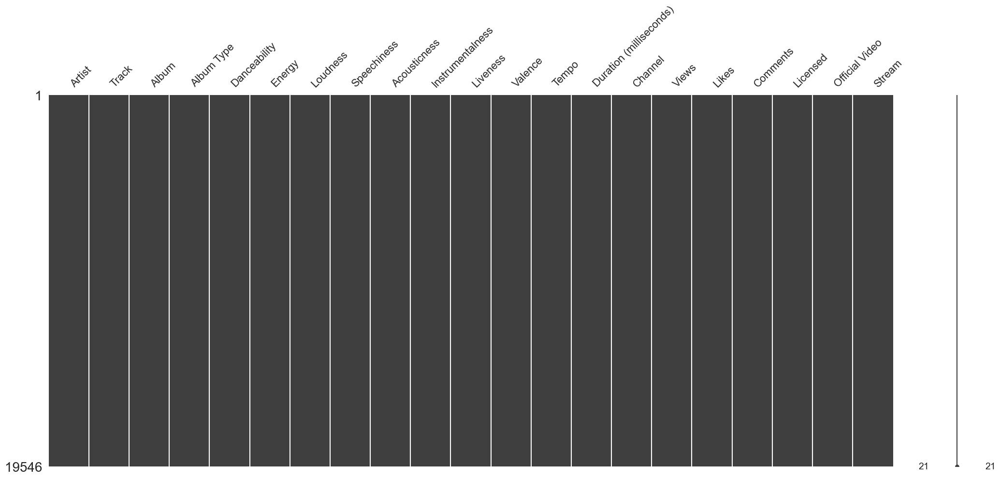

In [26]:
ax = msno.matrix(df.sample(19546))

In [27]:
df.isnull().sum()

Artist                     0
Track                      0
Album                      0
Album Type                 0
Danceability               0
Energy                     0
Loudness                   0
Speechiness                0
Acousticness               0
Instrumentalness           0
Liveness                   0
Valence                    0
Tempo                      0
Duration (milliseconds)    0
Channel                    0
Views                      0
Likes                      0
Comments                   0
Licensed                   0
Official Video             0
Stream                     0
dtype: int64

### 2.6 Imputing Missing Values

### 2.7 Handling Duplicates Rows

In [28]:
df[df.duplicated()].shape

(0, 21)

In [29]:
df.count()

Artist                     19546
Track                      19546
Album                      19546
Album Type                 19546
Danceability               19546
Energy                     19546
Loudness                   19546
Speechiness                19546
Acousticness               19546
Instrumentalness           19546
Liveness                   19546
Valence                    19546
Tempo                      19546
Duration (milliseconds)    19546
Channel                    19546
Views                      19546
Likes                      19546
Comments                   19546
Licensed                   19546
Official Video             19546
Stream                     19546
dtype: int64

### 2.8 Type Conversion

In [30]:
df.dtypes

Artist                      object
Track                       object
Album                       object
Album Type                  object
Danceability               float64
Energy                     float64
Loudness                   float64
Speechiness                float64
Acousticness               float64
Instrumentalness           float64
Liveness                   float64
Valence                    float64
Tempo                      float64
Duration (milliseconds)    float64
Channel                     object
Views                      float64
Likes                      float64
Comments                   float64
Licensed                    object
Official Video              object
Stream                     float64
dtype: object

In [31]:
# df.head()

### 2.9 Relationships

,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration (milliseconds),Views,Likes,Comments,Stream
Danceability,1.000000,0.238019,0.357628,0.226480,-0.281433,-0.321492,-0.083330,0.463226,-0.063133,-0.089271,0.088042,0.097747,0.042781,0.071345
Energy,0.238019,1.000000,0.745393,0.088810,-0.662148,-0.316836,0.174264,0.391678,0.155359,0.023946,0.067271,0.063186,0.045468,0.045143
Loudness,0.357628,0.745393,1.000000,0.068061,-0.552863,-0.556149,0.087019,0.316012,0.142843,0.011951,0.118225,0.123615,0.058982,0.118829
Speechiness,0.226480,0.088810,0.068061,1.000000,-0.098143,-0.112540,0.066036,0.060485,0.050532,-0.049337,-0.009963,0.012606,0.010114,-0.016362
Acousticness,-0.281433,-0.662148,-0.552863,-0.098143,1.000000,0.282639,-0.052517,-0.205588,-0.129326,-0.024716,-0.070613,-0.079386,-0.053332,-0.104875
Instrumentalness,-0.321492,-0.316836,-0.556149,-0.112540,0.282639,1.000000,-0.057177,-0.270297,-0.081988,-0.006918,-0.079696,-0.080035,-0.031920,-0.091935
Liveness,-0.083330,0.174264,0.087019,0.066036,-0.052517,-0.057177,1.000000,0.031820,0.008532,-0.000987,-0.016394,-0.022753,-0.012660,-0.037123
Valence,0.463226,0.391678,0.316012,0.060485,-0.205588,-0.270297,0.031820,1.000000,0.091718,-0.050660,0.037183,0.012541,0.017822,-0.012801
Tempo,-0.063133,0.155359,0.142843,0.050532,-0.129326,-0.081988,0.008532,0.091718,1.000000,-0.013945,-0.001305,0.002468,0.008209,0.002941
Duration (milliseconds),-0.089271,0.023946,0.011951,-0.049337,-0.024716,-0.006918,-0.000987,-0.050660,-0.013945,1.000000,0.022080,0.006714,-0.000857,-0.011050


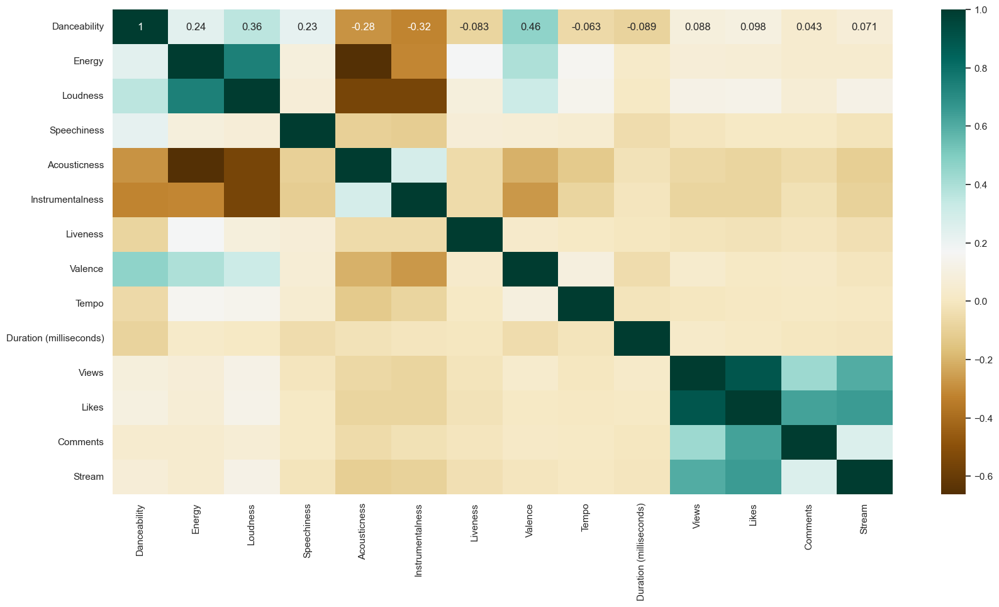

In [32]:
df_numeric = df.select_dtypes(include = ['number'])

plt.figure(figsize = (20, 10))
correlation_matrix = df_numeric.corr()

sns.heatmap(correlation_matrix, cmap = "BrBG", annot = True)
correlation_matrix

Inspects

In [33]:
# sns.set_theme(style = "ticks")
# sns.pairplot(df[['Danceability', 'Energy', 'Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo', 'Duration (milliseconds)', 'Views', 'Likes', 'Comments', 'Stream']])

Create a histogram using the graphic `.displot` from the library `seaborn` for check the distribuition of all numerical features below: Danceability, Energy, Loudness, Speechiness, Acousticness, Instrumentalness, Liveness, Valence, Tempo, Duration (milliseconds), Views, Likes, Comments, Stream

The examples bellow will be refined with a mark for show us the mean and median on the graphic, example got from the GitHub Gist using the command "`.axvline`" for get a "Distribution plot with mean and median" (Cereniyim, 2019), also checked about the parameters on matplotlib website for "Add a vertical line across the Axes" (The Matplotlib Development Team, 2024).

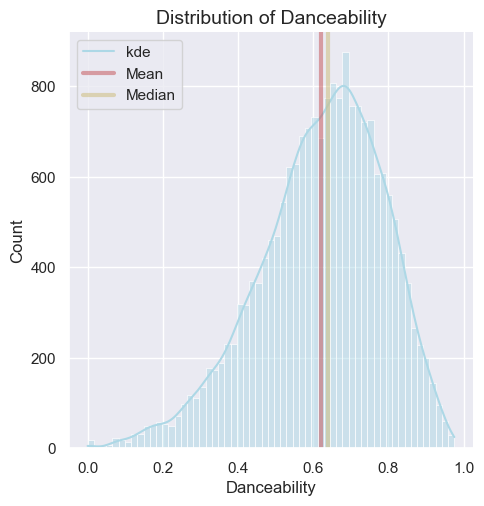

Mean: 0.62, Median: 0.64
Standard Deviation: 0.17


In [34]:
sns.displot(df["Danceability"], color = "lightblue", kde = True)
plt.axvline(df["Danceability"].mean(), linewidth = 3, color = 'r', label = "mean", alpha = 0.5)
plt.axvline(df["Danceability"].median(), linewidth = 3, color = 'y', label = "median", alpha = 0.5)
plt.title("Distribution of Danceability", size = 14)
plt.legend(["kde", "Mean", "Median"])
plt.show()

print('Mean: {:.2f}, Median: {:.2f}'.format(df['Danceability'].mean(), df['Danceability'].median()))
print('Standard Deviation: {:.2f}'.format(df['Danceability'].std()))

 **Distribution of Danceability:** 
The distribution is `skewed to the left side` showing that the most of the songs are suitable for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity.
A value of 0.0 is least danceable and 1.0 is most danceable.

Statistical Values: Mean: **0.62**, Median: **0.64** and Standard Deviation: **0.17**

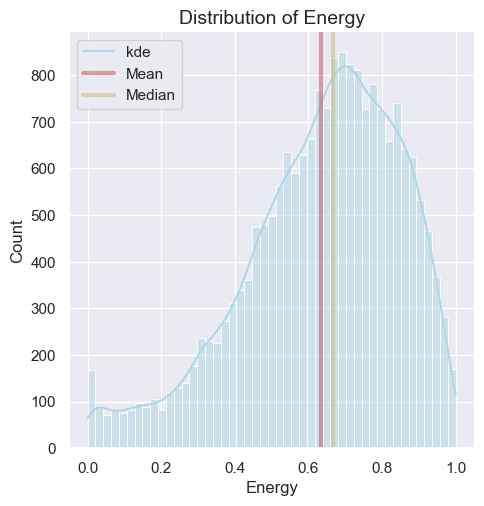

Mean: 0.64, Median: 0.67
Standard Deviation: 0.21


In [35]:
sns.displot(df["Energy"], color = "lightblue", kde = True)
plt.axvline(df["Energy"].mean(), linewidth = 3, color = 'r', label = "mean", alpha = 0.5)
plt.axvline(df["Energy"].median(), linewidth = 3, color = 'y', label = "median", alpha = 0.5)
plt.title("Distribution of Energy", size = 14)
plt.legend(["kde", "Mean", "Median"])
plt.show()

print('Mean: {:.2f}, Median: {:.2f}'.format(df['Energy'].mean(), df['Energy'].median()))
print('Standard Deviation: {:.2f}'.format(df['Energy'].std()))

**Distribution of Energy:** 
The distribution is `skewed to the left side` showing that the most of the songs are energetic feel fast, loud, and noisy. From 0.0 to 1.0 represents a perceptual measure of intensity and activity.

Statistical Values: Mean: **0.64**, Median: **0.67** and Standard Deviation: **0.21**

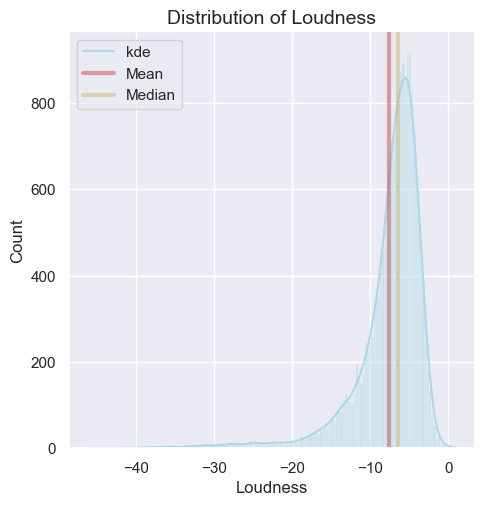

Mean: -7.63, Median: -6.52
Standard Deviation: 4.62


In [36]:
sns.displot(df["Loudness"], color = "lightblue", kde = True)
plt.axvline(df["Loudness"].mean(), linewidth = 3, color = 'r', label = "mean", alpha = 0.5)
plt.axvline(df["Loudness"].median(), linewidth = 3, color = 'y', label = "median", alpha = 0.5)
plt.title("Distribution of Loudness", size = 14)
plt.legend(["kde", "Mean", "Median"])
plt.show()

print('Mean: {:.2f}, Median: {:.2f}'.format(df['Loudness'].mean(), df['Loudness'].median()))
print('Standard Deviation: {:.2f}'.format(df['Loudness'].std()))

**Distribution of Loudness:** 
The distribution is `skewed to the left side` showing that most of the songs are not prejudicial to the ears considering the quality of a sound that is the primary psychological correlate of physical strength (amplitude). The overall loudness of a track in decibels (dB).

Statistical Values: Mean: **-7.63**, Median: **-6.52** and Standard Deviation: **4.62**

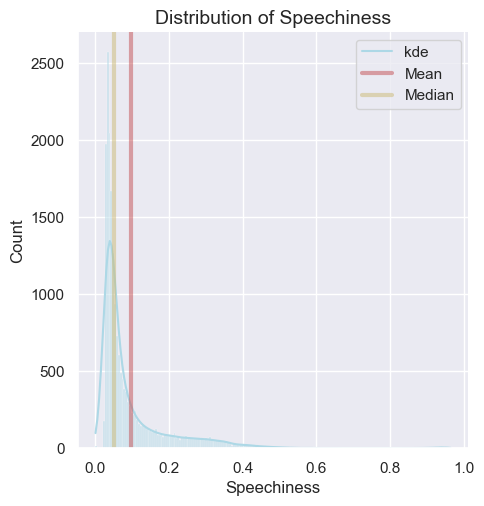

Mean: 0.10, Median: 0.05
Standard Deviation: 0.11


In [37]:
sns.displot(df["Speechiness"], color = "lightblue", kde = True)
plt.axvline(df["Speechiness"].mean(), linewidth = 3, color = 'r', label = "mean", alpha = 0.5)
plt.axvline(df["Speechiness"].median(), linewidth = 3, color = 'y', label = "median", alpha = 0.5)
plt.title("Distribution of Speechiness", size = 14)
plt.legend(["kde", "Mean", "Median"])
plt.show()

print('Mean: {:.2f}, Median: {:.2f}'.format(df['Speechiness'].mean(), df['Speechiness'].median()))
print('Standard Deviation: {:.2f}'.format(df['Speechiness'].std()))

**Distribution of Speechiness:** 
The distribution is `skewed to the right side` showing the presence of low Speechiness values which means values below 0.33 most likely represent music and other non-speech-like tracks, just a few parts of the songs detect the presence of spoken words in a track.

Statistical Values: Mean: **0.10**, Median: **0.05** and Standard Deviation: **0.11**

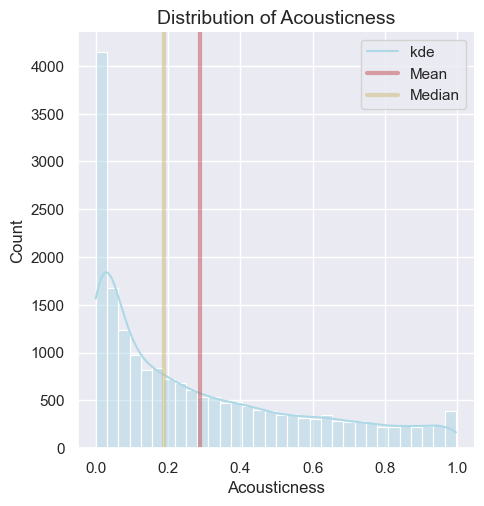

Mean: 0.29, Median: 0.19
Standard Deviation: 0.29


In [38]:
sns.displot(df["Acousticness"], color = "lightblue", kde = True)
plt.axvline(df["Acousticness"].mean(), linewidth = 3, color = 'r', label = "mean", alpha = 0.5)
plt.axvline(df["Acousticness"].median(), linewidth = 3, color = 'y', label = "median", alpha = 0.5)
plt.title("Distribution of Acousticness", size = 14)
plt.legend(["kde", "Mean", "Median"])
plt.show()

print('Mean: {:.2f}, Median: {:.2f}'.format(df['Acousticness'].mean(), df['Acousticness'].median()))
print('Standard Deviation: {:.2f}'.format(df['Acousticness'].std()))

**Distribution of Acousticness:** 
The distribution is `skewed to the right side` showing that most of the songs are less acoustic than most songs. 

Measure from 0.0 to 1.0 of whether the track is acoustic

Statistical Values: Mean: **0.29**, Median: **0.19** and Standard Deviation: **0.29**

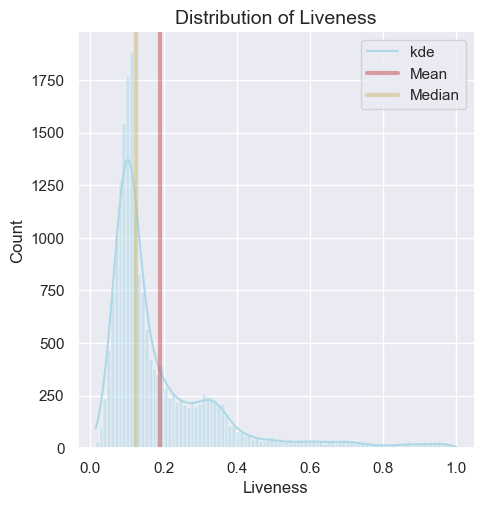

Mean: 0.19, Median: 0.12
Standard Deviation: 0.17


In [39]:
sns.displot(df["Liveness"], color = "lightblue", kde = True)
plt.axvline(df["Liveness"].mean(), linewidth = 3, color = 'r', label = "mean", alpha = 0.5)
plt.axvline(df["Liveness"].median(), linewidth = 3, color = 'y', label = "median", alpha = 0.5)

plt.title("Distribution of Liveness", size = 14)
plt.legend(["kde", "Mean", "Median"])
plt.show()

print('Mean: {:.2f}, Median: {:.2f}'.format(df['Liveness'].mean(), df['Liveness'].median()))
print('Standard Deviation: {:.2f}'.format(df['Liveness'].std()))

**Distribution of Liveness:** 
The distribution is `skewed to the right side` showing that most of the songs do not have the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live.

Statistical Values: Mean: **0.19**, Median: **0.12** and Standard Deviation: **0.17**

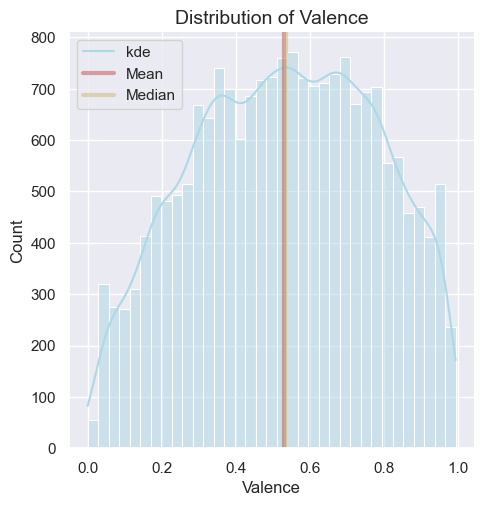

Mean: 0.53, Median: 0.54
Standard Deviation: 0.25


In [40]:
sns.displot(df["Valence"], color = "lightblue", kde = True)
plt.axvline(df["Valence"].mean(), linewidth = 3, color = 'r', label = "mean", alpha = 0.5)
plt.axvline(df["Valence"].median(), linewidth = 3, color = 'y', label = "median", alpha = 0.5)
plt.title("Distribution of Valence", size = 14)
plt.legend(["kde", "Mean", "Median"])
plt.show()

print('Mean: {:.2f}, Median: {:.2f}'.format(df['Valence'].mean(), df['Valence'].median()))
print('Standard Deviation: {:.2f}'.format(df['Valence'].std()))

**Distribution of Valence:** 
The distribution is `considered a normal distribution` is a symmetric data due to the values Mean/Median being practically in the centre of the graph this distribution shows that there is a good distribution with the median amount of the songs showing positiveness, which is more positive than negative songs. 

A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry).

Statistical Values: Mean: **0.53**, Median: **0.54** and Standard Deviation: **0.25**

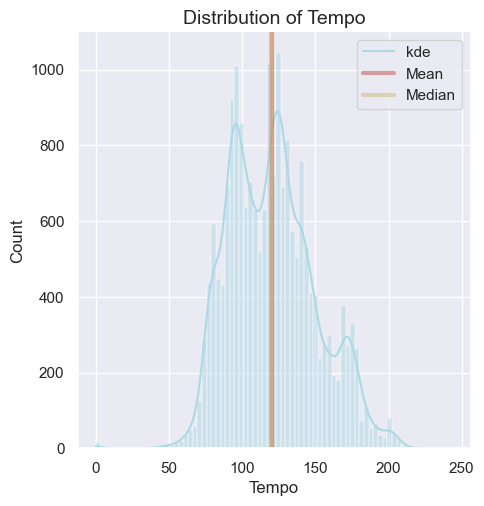

Mean: 120.61, Median: 119.96
Standard Deviation: 29.62


In [41]:
sns.displot(df["Tempo"], color = "lightblue", kde = True)
plt.axvline(df["Tempo"].mean(), linewidth = 3, color = 'r', label = "mean", alpha = 0.5)
plt.axvline(df["Tempo"].median(), linewidth = 3, color = 'y', label = "median", alpha = 0.5)
plt.title("Distribution of Tempo", size = 14)
plt.legend(["kde", "Mean", "Median"])
plt.show()

print('Mean: {:.2f}, Median: {:.2f}'.format(df['Tempo'].mean(), df['Tempo'].median()))
print('Standard Deviation: {:.2f}'.format(df['Tempo'].std()))

**Distribution of Tempo:** 
The distribution is `almost a normal distribution` but the data is bimodal showing us an up, down, up, down, up, down, this data represent the distribution of an estimated tempo of a track in beats per minute (BPM).

In musical terminology, tempo is the speed or pace of a given piece and derives directly from the average beat duration.

Statistical Values: Mean: **120.61**, Median: **119.96** and Standard Deviation: **29.62**

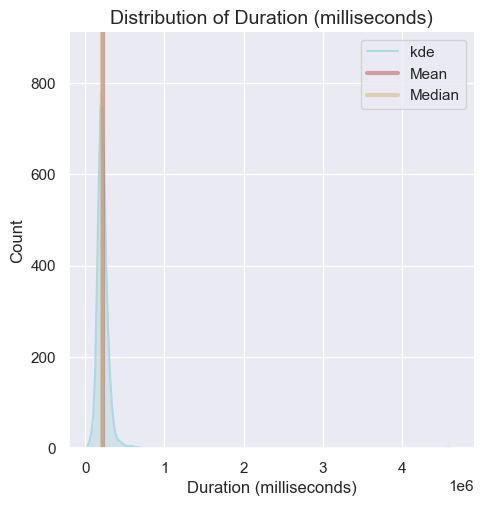

Mean: 224641.50, Median: 213254.00
Standard Deviation: 126917.40


In [42]:
sns.displot(df["Duration (milliseconds)"], color = "lightblue", kde = True)
plt.axvline(df["Duration (milliseconds)"].mean(), linewidth = 3, color = 'r', label = "mean", alpha = 0.5)
plt.axvline(df["Duration (milliseconds)"].median(), linewidth = 3, color = 'y', label = "median", alpha = 0.5)
plt.title("Distribution of Duration (milliseconds)", size = 14)
plt.legend(["kde", "Mean", "Median"])
plt.show()

print('Mean: {:.2f}, Median: {:.2f}'.format(df['Duration (milliseconds)'].mean(), df['Duration (milliseconds)'].median()))
print('Standard Deviation: {:.2f}'.format(df['Duration (milliseconds)'].std()))

**Distribution of Duration (milliseconds):** 
The distribution is `skewed to the right side` showing that most of the songs have a short duration and the most of songs long duration.

The duration of the track in milliseconds.

Statistical Values: Mean: **224641.50**, Median: **213254.00** and Standard Deviation: **126917.40**

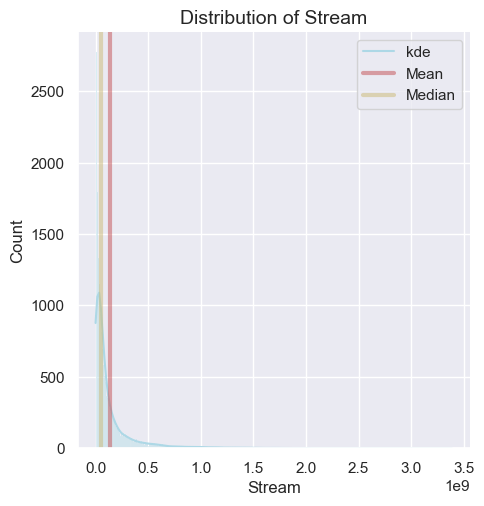

Mean: 136895246.48, Median: 49791393.00
Standard Deviation: 245723431.08


In [43]:
sns.displot(df["Stream"], color = "lightblue", kde = True)
plt.axvline(df["Stream"].mean(), linewidth = 3, color = 'r', label = "mean", alpha = 0.5)
plt.axvline(df["Stream"].median(), linewidth = 3, color = 'y', label = "median", alpha = 0.5)
plt.title("Distribution of Stream", size = 14)
plt.legend(["kde", "Mean", "Median"])
plt.show()

print('Mean: {:.2f}, Median: {:.2f}'.format(df['Stream'].mean(), df['Stream'].median()))
print('Standard Deviation: {:.2f}'.format(df['Stream'].std()))

**Distribution of Stream:** 
The distribution is `skewed to the right side` showing the number of streams of the song on Spotify.

Statistical Values: Mean: **136895246.48**, Median: **49791393.00** and Standard Deviation: **245723431.08**

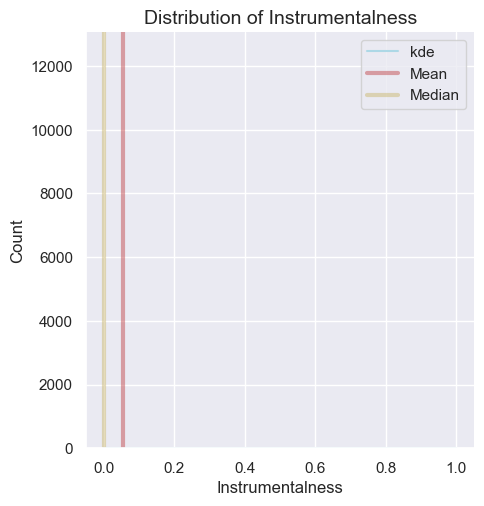

Mean: 0.06, Median: 0.00
Standard Deviation: 0.19


In [44]:
sns.displot(df["Instrumentalness"], color = "lightblue", kde = True)
plt.axvline(df["Instrumentalness"].mean(), linewidth = 3, color = 'r', label = "mean", alpha = 0.5)
plt.axvline(df["Instrumentalness"].median(), linewidth = 3, color = 'y', label = "median", alpha = 0.5)
plt.title("Distribution of Instrumentalness", size = 14)
plt.legend(["kde", "Mean", "Median"])
plt.show()

print('Mean: {:.2f}, Median: {:.2f}'.format(df['Instrumentalness'].mean(), df['Instrumentalness'].median()))
print('Standard Deviation: {:.2f}'.format(df['Instrumentalness'].std()))

**Distribution of Instrumentalness:** 
The distribution is `skewed to the right side` showing that most songs contain vocals than instrumentals and contain no vocals.

The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content. Values above 0.5 are intended to represent instrumental tracks, but confidence is higher as the value approaches 1.0.

Statistical Values: Mean: **0.06**, Median: **0.00** and Standard Deviation: **0.19**

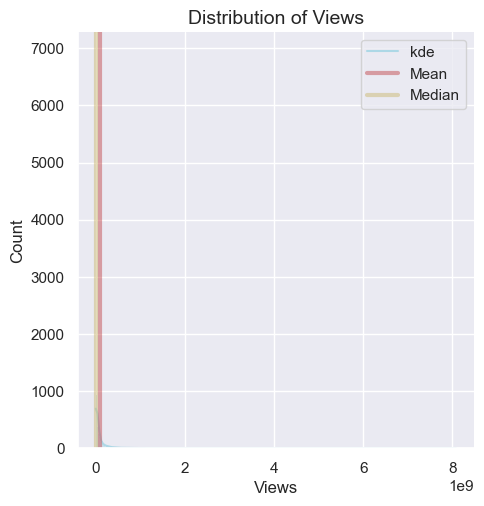

Mean: 95404312.28, Median: 14890243.50
Standard Deviation: 277514961.73


In [45]:
sns.displot(df["Views"], color = "lightblue", kde = True)
plt.axvline(df["Views"].mean(), linewidth = 3, color = 'r', label = "mean", alpha = 0.5)
plt.axvline(df["Views"].median(), linewidth = 3, color = 'y', label = "median", alpha = 0.5)
plt.title("Distribution of Views", size = 14)
plt.legend(["kde", "Mean", "Median"])
plt.show()

print('Mean: {:.2f}, Median: {:.2f}'.format(df['Views'].mean(), df['Views'].median()))
print('Standard Deviation: {:.2f}'.format(df['Views'].std()))

**Distribution of Views:** 
The distribution is `skewed to the right side` showing the huge amount number of views between the songs.

Statistical Values: Mean: **95404312.28**, Median: **14890243.50** and Standard Deviation: **277514961.73**

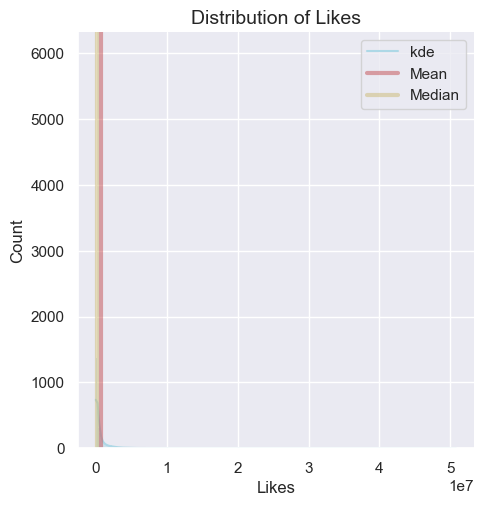

Mean: 668808.49, Median: 127856.50
Standard Deviation: 1800467.50


In [46]:
sns.displot(df["Likes"], color = "lightblue", kde = True)
plt.axvline(df["Likes"].mean(), linewidth = 3, color = 'r', label = "mean", alpha = 0.5)
plt.axvline(df["Likes"].median(), linewidth = 3, color = 'y', label = "median", alpha = 0.5)
plt.title("Distribution of Likes", size = 14)
plt.legend(["kde", "Mean", "Median"])
plt.show()

print('Mean: {:.2f}, Median: {:.2f}'.format(df['Likes'].mean(), df['Likes'].median()))
print('Standard Deviation: {:.2f}'.format(df['Likes'].std()))

**Distribution of Views:** 
The distribution is `skewed to the right side` showing the huge amount number of likes between the songs.

Statistical Values: Mean: **668808.49**, Median: **127856.50** and Standard Deviation: **1800467.50**

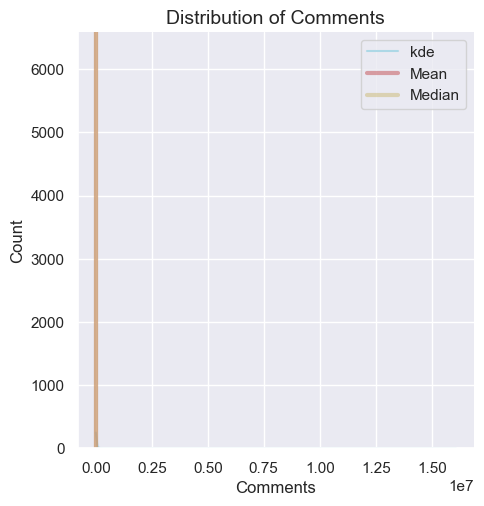

Mean: 27766.95, Median: 3339.00
Standard Deviation: 195678.94


In [47]:
sns.displot(df["Comments"], color = "lightblue", kde = True)
plt.axvline(df["Comments"].mean(), linewidth = 3, color = 'r', label = "mean", alpha = 0.5)
plt.axvline(df["Comments"].median(), linewidth = 3, color = 'y', label = "median", alpha = 0.5)
plt.title("Distribution of Comments", size = 14)
plt.legend(["kde", "Mean", "Median"])
plt.show()

print('Mean: {:.2f}, Median: {:.2f}'.format(df['Comments'].mean(), df['Comments'].median()))
print('Standard Deviation: {:.2f}'.format(df['Comments'].std()))

**Distribution of Comments:** 
The distribution is `skewed to the right side` showing the huge amount number of comments between the songs.

Statistical Values: Mean: **27766.95**, Median: **3339.00** and Standard Deviation: **195678.94**

Even the database does not describe the scale of Views, Likes and Comments, let's consider that if the majority of values are close to 0, the greater the views, likes and comments on each song.

<Axes: >

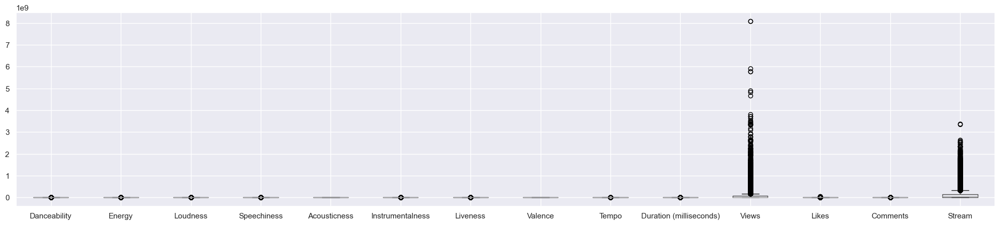

In [48]:
df.boxplot(figsize = (25, 5))

Got an exaple from the website: proclusacademy for create a "Boxplot With Separate Y-Axis for Each Column" (Yashmeet Singh, 2022)

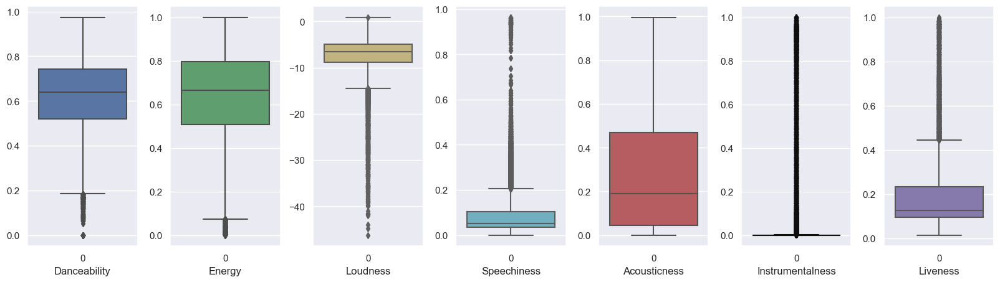

In [49]:
# 'Danceability', 'Energy', 'Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness', 'Liveness'

fig, ax = plt.subplots(1, 7, figsize = (20, 5))

plt.subplots_adjust(wspace = 0.3) 

sns.boxplot(data = df['Danceability'], ax = ax[0], color = 'b',)
ax[0].set_xlabel('Danceability')
 
sns.boxplot(data = df['Energy'], ax = ax[1], color='g')
ax[1].set_xlabel('Energy')
 
sns.boxplot(data = df['Loudness'], ax = ax[2], color='y')
ax[2].set_xlabel('Loudness')
 
sns.boxplot(data = df['Speechiness'], ax = ax[3], color='c')
ax[3].set_xlabel('Speechiness')

sns.boxplot(data = df['Acousticness'], ax = ax[4], color='r')
ax[4].set_xlabel('Acousticness')

sns.boxplot(data = df['Instrumentalness'], ax = ax[5], color='k')
ax[5].set_xlabel('Instrumentalness')

sns.boxplot(data = df['Liveness'], ax = ax[6], color='m')
ax[6].set_xlabel('Liveness')
    
plt.show()

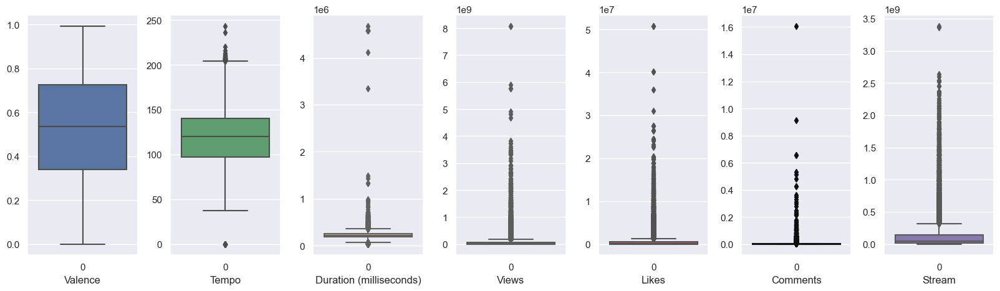

In [50]:
# 'Valence', 'Tempo', 'Duration (milliseconds)', 'Views', 'Likes', 'Comments', 'Stream'

fig, ax = plt.subplots(1, 7, figsize = (20, 5))

plt.subplots_adjust(wspace = 0.3) 

sns.boxplot(data = df['Valence'], ax = ax[0], color = 'b',)
ax[0].set_xlabel('Valence')
 
sns.boxplot(data = df['Tempo'], ax = ax[1], color='g')
ax[1].set_xlabel('Tempo')
 
sns.boxplot(data = df['Duration (milliseconds)'], ax = ax[2], color='y')
ax[2].set_xlabel('Duration (milliseconds)')
 
sns.boxplot(data = df['Views'], ax = ax[3], color='c')
ax[3].set_xlabel('Views')

sns.boxplot(data = df['Likes'], ax = ax[4], color='r')
ax[4].set_xlabel('Likes')

sns.boxplot(data = df['Comments'], ax = ax[5], color='k')
ax[5].set_xlabel('Comments')

sns.boxplot(data = df['Stream'], ax = ax[6], color='m')
ax[6].set_xlabel('Stream')
    
plt.show()

'Danceability', 'Energy', 'Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo', 'Duration (milliseconds)', 'Views', 'Likes', 'Comments', 'Stream'

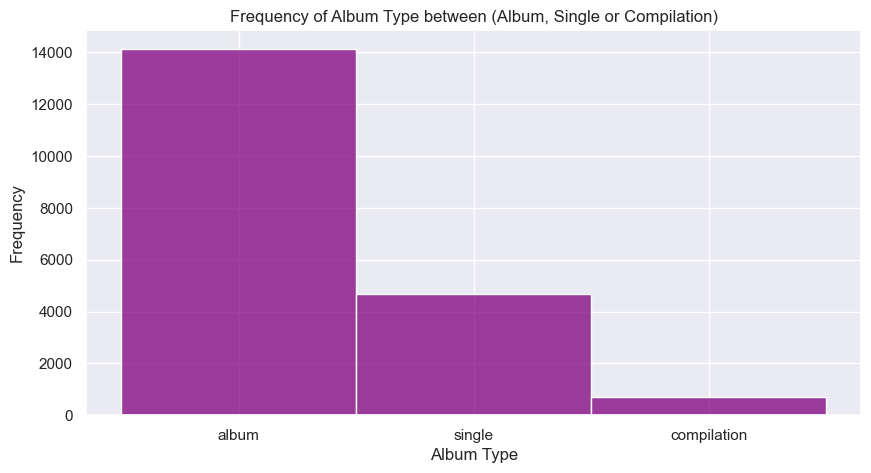

In [51]:
plt.figure(figsize = (10, 5))
sns.histplot(data = df, x = 'Album Type', color = 'purple')
plt.title("Frequency of Album Type between (Album, Single or Compilation)")
plt.xlabel('Album Type');
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

Example learned from W3Schools "Creating Pie Charts" (W3Schools, 2024)

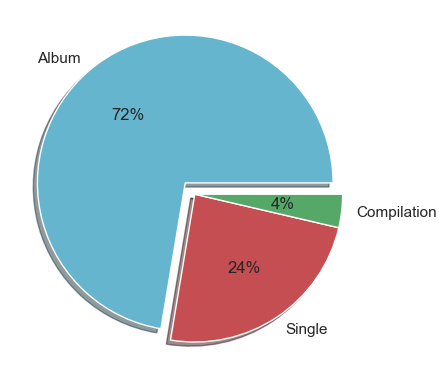

In [52]:
df_pie = df.copy()
df_pie['Album Type'] = df_pie['Album Type'].replace(['album', 'single', 'compilation'], [1, 2, 3])
valuesAlbumType = df_pie['Album Type'].value_counts()

labels = ['Album', 'Single', 'Compilation']
explode = [0.1, 0, 0]
colors = ["c", "r", "g"]

plt.pie(valuesAlbumType, labels = labels, explode = explode, colors = colors, shadow = True, autopct='%.0f%%')
plt.show() 

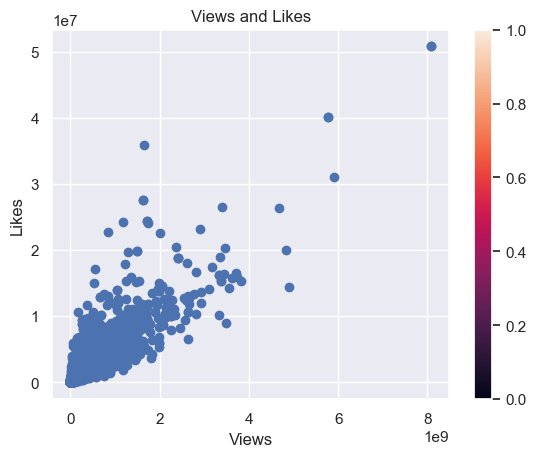

In [53]:
plt.scatter(data = df, x = "Views", y = "Likes", cmap='viridis')
plt.colorbar()
plt.title("Views and Likes")
plt.xlabel("Views")
plt.ylabel("Likes")
plt.show()

Example got from the website Plotly using "Linear fit trendlines with Plotly Express
Plotly Express is the easy-to-use, high-level interface to Plotly, which operates on a variety of types of data and produces easy-to-style figures.

Plotly Express allows you to add Ordinary Least Squares regression trendline to scatterplots with the trendline argument." (Plotly, 2024a)

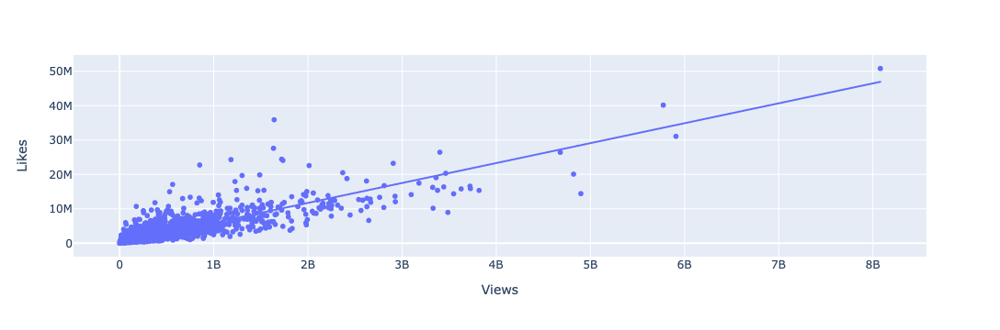

In [54]:
import plotly.express as px
fig = px.scatter(df, x = "Views", y = "Likes", trendline = "ols")
fig.show()

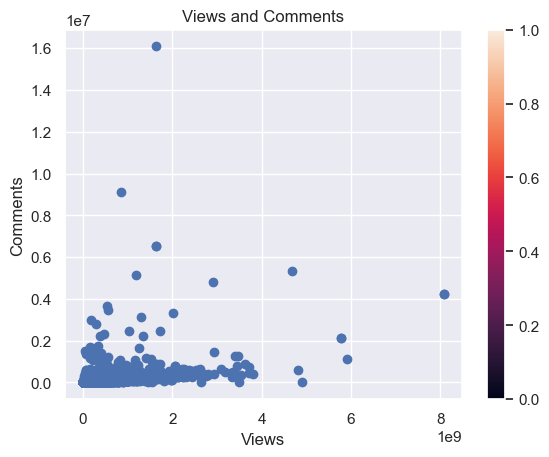

In [55]:
plt.scatter(data = df, x = "Views", y = "Comments", cmap='viridis')
plt.colorbar()
plt.title("Views and Comments")
plt.xlabel("Views")
plt.ylabel("Comments")
plt.show()

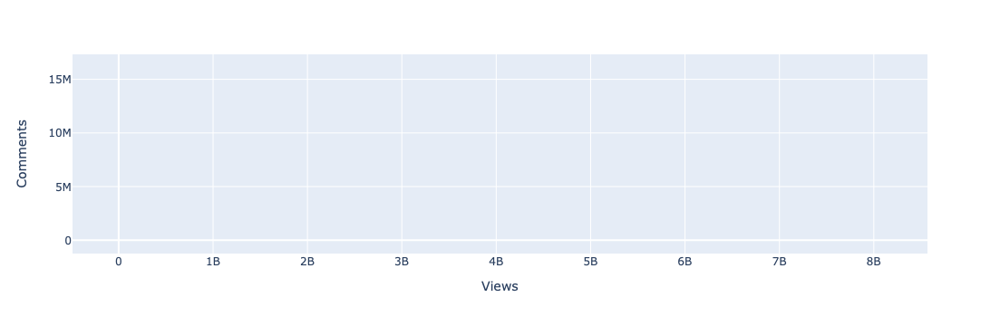

In [56]:
fig = px.scatter(df, x = "Views", y = "Comments", trendline = "ols")
fig.show()

In [57]:
# fig = px.histogram(df.groupby('Artist', as_index = False).count().sort_values(by = 'Track', ascending = False),x = 'Artist', y = 'Track', color_discrete_sequence = ['green'], template='plotly_dark', marginal='box', title='<b>Total Tracks by Artist</b>')
# fig.update_layout(title_x = 0.5)

# df.groupby('Artist', as_index = False).count().sort_values(by = 'Views', ascending = False).head(5)

In [58]:
df.columns

Index(['Artist', 'Track', 'Album', 'Album Type', 'Danceability', 'Energy',
       'Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness',
       'Liveness', 'Valence', 'Tempo', 'Duration (milliseconds)', 'Channel',
       'Views', 'Likes', 'Comments', 'Licensed', 'Official Video', 'Stream'],
      dtype='object')

"Treemap of a rectangular DataFrame with plotly.express
Hierarchical data are often stored as a rectangular dataframe, with different columns corresponding to different levels of the hierarchy. px.treemap can take a path parameter corresponding to a list of columns." (Plotly, 2024b)

Treemaps are an effective way of visualizing categorical data in a small space. (Madhugiri, 2021)

In [59]:
# import plotly.express as px

# fig = px.treemap(df, path = [px.Constant("all"), 'Artist', 'Track', 'Album'], values = 'Views')
# fig.update_traces(root_color = "lightblue")
# fig.update_layout(margin = dict(t = 50, l = 25, r = 25, b = 25))
# fig.show()

In [60]:
from sklearn import preprocessing

In [61]:
# X_train = StandardScaler.fit_transform(X_train)
# X_test = StandardScaler.fit_transform(X_test)

In [62]:
# df = preprocessing.normalize(df, axis = 0)

In [63]:
df_scaled = df.copy()

In [64]:
df_scaled[['Danceability', 'Energy', 'Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness',
'Liveness', 'Valence', 'Tempo', 'Duration (milliseconds)',
'Views', 'Likes', 'Comments', 'Stream']] = preprocessing.scale(df[['Danceability', 'Energy', 'Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness',
'Liveness', 'Valence', 'Tempo', 'Duration (milliseconds)',
'Views', 'Likes', 'Comments', 'Stream']])

In [65]:
df_scaled.head()

,Artist,Track,Album,Album Type,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,...,Valence,Tempo,Duration (milliseconds),Channel,Views,Likes,Comments,Licensed,Official Video,Stream
0,Gorillaz,Feel Good Inc.,Demon Days,album,1.190231,0.326908,0.206646,0.768089,-0.981849,-0.275131,...,0.991084,0.606130,-0.015770,Gorillaz,2.155438,3.083771,0.726413,True,True,3.676339
1,Gorillaz,Rhinestone Eyes,Plastic Beach,album,0.332127,0.317543,0.393699,-0.613587,-0.707142,-0.283665,...,1.317312,-0.940135,-0.192796,Gorillaz,-0.084296,0.227902,0.016538,True,True,0.704829
2,Gorillaz,New Gold (feat. Tame Impala and Bootie Brown),New Gold (feat. Tame Impala and Bootie Brown),single,0.446944,1.347697,0.801796,-0.406523,-0.862439,-0.043632,...,0.089878,-0.425152,-0.074787,Gorillaz,-0.313394,-0.214764,-0.104091,True,True,-0.300475
3,Gorillaz,On Melancholy Hill,Plastic Beach,album,0.410686,0.486114,0.394782,-0.653117,-1.011037,2.356543,...,0.199980,-0.006191,0.072691,Gorillaz,0.419270,0.621948,0.140346,True,True,1.211834
4,Gorillaz,Clint Eastwood,Gorillaz,album,0.253568,0.275401,-0.215091,0.711617,-0.922599,-0.287233,...,-0.016146,1.598552,0.916198,Gorillaz,1.884907,3.070675,0.654983,True,True,1.954949


### 2.4 Creating Dummies

- **Track**: name of the song, as visible on the Spotify platform.
- **Artist**: name of the artist.
- **Url_spotify**: the Url of the artist.
- **Album**: the album in wich the song is contained on Spotify.
- **Album_type**: indicates if the song is relesead on Spotify as a single or contained in an album.
- **Uri**: a spotify link used to find the song through the API.
- **Danceability**: describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is least danceable and 1.0 is most danceable.
- **Energy**: is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity. Typically, energetic tracks feel fast, loud, and noisy. For example, death metal has high energy, while a Bach prelude scores low on the scale. Perceptual features contributing to this attribute include dynamic range, perceived loudness, timbre, onset rate, and general entropy.
- **Key**: the key the track is in. Integers map to pitches using standard Pitch Class notation. E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on. If no key was detected, the value is -1.
- **Loudness**: the overall loudness of a track in decibels (dB). Loudness values are averaged across the entire track and are useful for comparing relative loudness of tracks. Loudness is the quality of a sound that is the primary psychological correlate of physical strength (amplitude). Values typically range between -60 and 0 db.
- **Speechiness**: detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value. Values above 0.66 describe tracks that are probably made entirely of spoken words. Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. Values below 0.33 most likely represent music and other non-speech-like tracks.
- **Acousticness**: a confidence measure from 0.0 to 1.0 of whether the track is acoustic. 1.0 represents high confidence the track is acoustic.
- **Instrumentalness**: predicts whether a track contains no vocals. "Ooh" and "aah" sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly "vocal". The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content. Values above 0.5 are intended to represent instrumental tracks, but confidence is higher as the value approaches 1.0.
- **Liveness**: detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live. A value above 0.8 provides strong likelihood that the track is live.
- **Valence**: a measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry).
- **Tempo**: the overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or pace of a given piece and derives directly from the average beat duration.
- **Duration_ms**: the duration of the track in milliseconds.
- **Stream**: number of streams of the song on Spotify.
- **Url_youtube**: url of the video linked to the song on Youtube, if it have any.
- **Title**: title of the videoclip on youtube.
- **Channel**: name of the channel that have published the video.
- **Views**: number of views.
- **Likes**: number of likes.
- **Comment**s: number of comments.
- **Description**: description of the video on Youtube.
- **Licensed**: Indicates whether the video represents licensed content, which means that the content was uploaded to a channel linked to a YouTube content partner and then claimed by that partner.
- **official_video**: boolean value that indicates if the video found is the official video of the song.